In [1]:
# Only flag for single warning if there are repeats
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

from panel_segmentation import utils
import glob
import matplotlib.pyplot as plt
from PIL import Image
import os
from shapely.geometry import Polygon
import geopandas
from mmengine import Config
from mmdet.apis import init_detector, inference_detector
from mmdet.registry import VISUALIZERS
from shapely.geometry import Polygon
import mmcv
import numpy as np
import pandas as pd
import torch

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\mmengine\optim\optimizer\zero_optimizer.py:11: DeprecationWarning: `TorchScript` support for functional optimizers is deprecated and will be removed in a future PyTorch release. Consider using the `torch.compile` optimizer instead.
  from torch.distributed.optim import \


# Hail Damage Detection

Download the hail model from the Hugging Face repository, if it's not already present in the /models folder (https://huggingface.co/kperrynrel/panel-segmentation-models/tree/main).

In [2]:
# Hail model
utils.downloadModel(
    filename="hail_model.pth"
)

Model already exists at C:\Users\kperry\OneDrive - NLR\Documents\source\repos\Panel-Segmentation\panel_segmentation\models\hail_model.pth, skipping download.


'C:\\Users\\kperry\\OneDrive - NLR\\Documents\\source\\repos\\Panel-Segmentation\\panel_segmentation\\models\\hail_model.pth'

The following example uses the hail detection pipeline to detect hail and calculate its damage on solar installations given a satellite imagery. First, let's pull some example images down from the hail data examples folder. This data is taken from a November 2023 scan of Austin, TX.

In [3]:
example_images = glob.glob("../../../panel_segmentation/examples/austin_hail_data_examples/*.png")
# Ignore images where inferences present
example_images = [img for img in example_images if ".png_0" not in img]

Let's visualize some of the images beforehand. Several of these images contain PV installations that have visible hail damage.

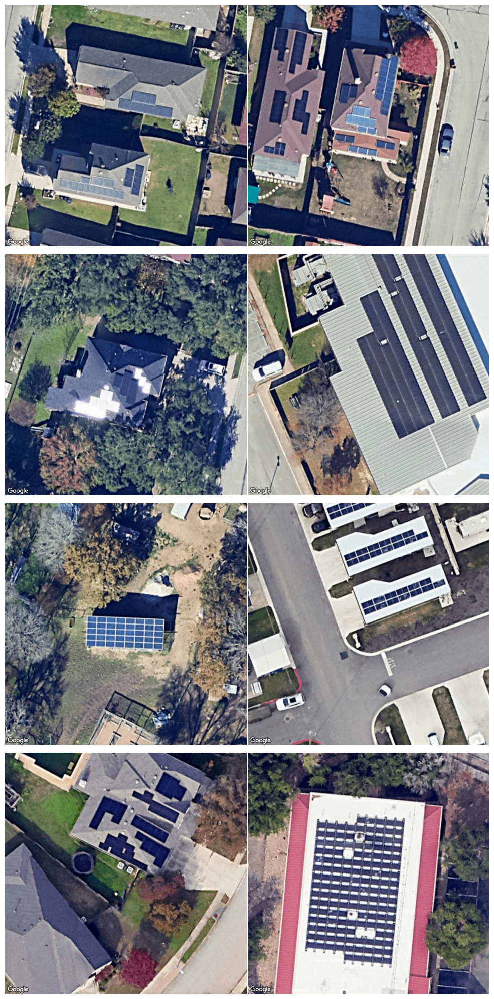

In [4]:
fig, axes = plt.subplots(4, 2, figsize=(10, 20))
axes = axes.ravel()  
for i, image_file in enumerate(example_images):
    img = Image.open(image_file)
    axes[i].imshow(img)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

Let's load in the hail model.

In [5]:
# Get hail model and checkpoint
cfg = Config.fromfile("../../../panel_segmentation/models/hail_config.py")
checkpoint_file = "../../../panel_segmentation/models/hail_model.pth"
model = init_detector(cfg, device='cpu')
checkpoint = torch.load(checkpoint_file, map_location='cpu', weights_only=False)
model.load_state_dict(checkpoint['state_dict'])
visualizer = VISUALIZERS.build(model.cfg.visualizer)

C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\mmdet\apis\inference.py:70: UserWarning: checkpoint is None, use COCO classes by default.
  warnings.warn('checkpoint is None, use COCO classes by default.')


Next, lets run these images through the hail detection algorithms, and visualize our mask outputs.

C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\mmdet\models\layers\se_layer.py:158: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\mmdet\models\backbones\csp_darknet.py:118: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\torch\functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3596.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\numpy\_core\fromnumeric.py:45: Depreca

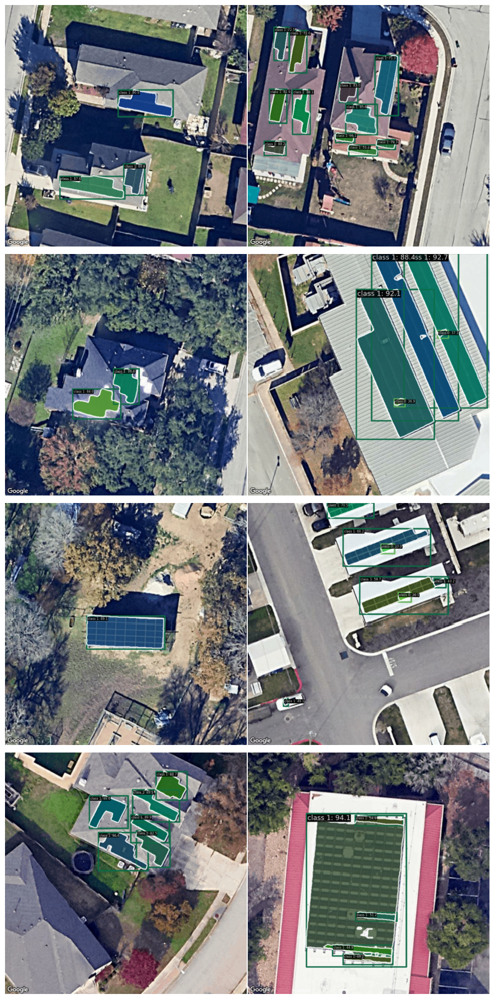

In [6]:
fig, axes = plt.subplots(4, 2, figsize=(10, 20))
axes = axes.ravel()  

# Run inference on all of the example images
inference_data_list = list()
results = list()
for i, file in enumerate(example_images):
    img = mmcv.imread(file, channel_order='rgb')
    new_result = inference_detector(model, img)
    visualizer.add_datasample(
          file,
          img,
          data_sample=new_result,
          draw_gt=None,
          wait_time=0,
          pred_score_thr=0.35
          )
    img = visualizer.get_image()
    axes[i].imshow(img)
    axes[i].axis('off')
    new_result.file = file
    results.append(new_result)
plt.tight_layout()
plt.show()

Let's calculate the percentage of hail damage by PV installation. 

In [7]:
inference_data_list = list()
for result in results:
    predictions = result._pred_instances
    masks = predictions.masks
    labels = predictions.labels
    scores = predictions.scores
    # Take all labels meeting a 0.3 threshold or greater
    idx_to_keep = np.argwhere(scores>=0.3).tolist()[0]
    file_name = os.path.basename(result.file)
    img_center_lat, img_center_lon = float(file_name.split("_")[0]), float(file_name.split("_")[-1].replace(".png", ""))
    image_x_pixels, image_y_pixels = new_result.img_shape
    # Convert all of the masks to latitude-longitude-based polygons
    for index in range(len(masks)):
            if index in idx_to_keep:
                segmentation_mask = masks[index].data.cpu().numpy()
                # Convert the mask to a polygon
                polygon_lat_lon_coords = utils.convertMaskToLatLonPolygon(segmentation_mask, 
                                                                    img_center_lat, 
                                                                    img_center_lon,
                                                                    image_x_pixels, 
                                                                    image_y_pixels,
                                                                    zoom_level=21)
                # Convert to a geoJSON
                polygon_lon_lat_coords = [(y, x) for x, y in polygon_lat_lon_coords]
                shapely_poly = Polygon(polygon_lon_lat_coords)
                geojson_poly = geopandas.GeoSeries(shapely_poly).to_json()
                inference_data_list.append({"image": result.file,
                                            "poly": shapely_poly,
                                            "poly_centroid_lon": shapely_poly.centroid.x,
                                            "poly_centroid_lat": shapely_poly.centroid.y,
                                            "area": shapely_poly.area,
                                            "label": int(labels[index])})
inference_df = pd.DataFrame(inference_data_list)
inference_df.head(10)

C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\numpy\_core\fromnumeric.py:45: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\numpy\_core\fromnumeric.py:45: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\numpy\_core\fromnumeric.py:45: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\numpy\_core\fromnumeric.py:45: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally

,image,poly,poly_centroid_lon,poly_centroid_lat,area,label
0,../../../panel_segmentation/examples/austin_ha...,"POLYGON ((-97.7410372702614 30.14785415189192,...",-97.741017,30.147833,2.060606e-09,1
1,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74103191039197 30.14774177215681...,-97.741035,30.147719,1.025230e-09,1
2,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74110761874037 30.14772255695745...,-97.741107,30.147707,2.214505e-09,1
3,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74256414650021 30.14777612648223...,-97.742565,30.147765,5.147609e-10,1
4,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74251590762063 30.14785473411978...,-97.742518,30.147821,1.113398e-09,1
5,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74242478948544 30.14783202531050...,-97.742412,30.147809,1.524973e-09,1
6,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.7424462290559 30.147865215174217...,-97.742438,30.147852,7.031886e-10,1
7,../../../panel_segmentation/examples/austin_ha...,"POLYGON ((-97.74256481661757 30.1478553163459,...",-97.742562,30.147830,9.637876e-10,1
8,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74238191038515 30.14777903797571...,-97.742371,30.147771,3.314054e-10,1
9,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74255945688114 30.14795081001137...,-97.742556,30.147928,8.184693e-10,1


In [8]:
# Filter to just modules (label == 1)
inference_df_modules = inference_df[inference_df['label'] == 1]
dmg_list = list()

for idx, row in inference_df_modules.iterrows():
    polygon = row['poly']
    # Get all of the potential overlapping modules
    other_masks = inference_df[inference_df['image'].str.contains(os.path.basename(row['image']))]
    other_masks = other_masks[other_masks['label'] == 0]
    total_dmg_amt = 0
    for idx2, row2 in other_masks.iterrows():
        sub_polygon = row2['poly']
        sub_label = row2['label']
        try:
            if sub_polygon.intersects(polygon):
                # Check if the small polygon is entirely within the large polygon.
                # If it's labeled 0, mark it as a duplicate and remove
                if ((sub_polygon.intersection(polygon).area/sub_polygon.area) * 100) > 90:
                    #plt.plot(*sub_polygon.exterior.xy)
                    # if this is a damage flag, check how much overlap there is for damage
                    if sub_label == 0:
                        dmg_pct = ((sub_polygon.area/
                                    polygon.area) * 100)
                        total_dmg_amt = total_dmg_amt + dmg_pct
        except:
            pass
    row_dict = row.to_dict()
    row_dict['total_damage_amt'] = total_dmg_amt
    dmg_list.append(row_dict)

dmg_df = pd.DataFrame(dmg_list)

# Visualize the dataframe, sorted by level of damage
dmg_df.sort_values(by=['total_damage_amt'], ascending=False).head(10)

,image,poly,poly_centroid_lon,poly_centroid_lat,area,label,total_damage_amt
22,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.6920229528419 30.487146219449322...,-97.692075,30.487119,2.618383e-09,1,13.473388
23,../../../panel_segmentation/examples/austin_ha...,"POLYGON ((-97.69199615390984 30.4870713689871,...",-97.692045,30.487045,2.605164e-09,1,6.714914
17,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.80183903117377 30.14898632715937...,-97.801764,30.148872,8.625823e-09,1,1.368097
18,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.80188794023911 30.14892926447665...,-97.801858,30.148806,1.325979e-08,1,0.920872
0,../../../panel_segmentation/examples/austin_ha...,"POLYGON ((-97.7410372702614 30.14785415189192,...",-97.741017,30.147833,2.060606e-09,1,0.000000
1,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74103191039197 30.14774177215681...,-97.741035,30.147719,1.025230e-09,1,0.000000
2,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74110761874037 30.14772255695745...,-97.741107,30.147707,2.214505e-09,1,0.000000
6,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.7424462290559 30.147865215174217...,-97.742438,30.147852,7.031886e-10,1,0.000000
5,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74242478948544 30.14783202531050...,-97.742412,30.147809,1.524973e-09,1,0.000000
4,../../../panel_segmentation/examples/austin_ha...,POLYGON ((-97.74251590762063 30.14785473411978...,-97.742518,30.147821,1.113398e-09,1,0.000000


Let's visualize the images that were flagged for hail-related damage.

C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\mmdet\models\layers\se_layer.py:158: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\mmdet\models\backbones\csp_darknet.py:118: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\kperry\.conda\envs\deep-learning\Lib\site-packages\numpy\_core\fromnumeric.py:45: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return conv.wrap(result, to_scalar=False)


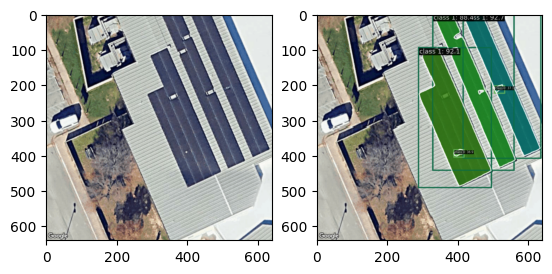

In [ ]:
dmg_df = dmg_df[dmg_df['total_damage_amt']>0]
dmg_images = list(dmg_df['image'].drop_duplicates())
for img_path in dmg_images:
    img = mmcv.imread(img_path, channel_order='rgb')
    new_result = inference_detector(model, img)
    visualizer.add_datasample(
          img_path,
          img,
          data_sample=new_result,
          draw_gt=None,
          wait_time=0
          )
    img_infer = visualizer.get_image()
    # Create subplots to visualize the original image + inference image side-by-side
    plt.subplot(1, 2, 1)
    img_orig = mmcv.imread(img_path, channel_order='rgb')
    plt.imshow(img_orig)
    plt.subplot(1, 2, 2)
    plt.imshow(img_infer)
    plt.show()
    plt.close()